In [ ]:
from utils import *
EPS = 1e-6

In [ ]:
class Copula():
    def __init__(self, data, density, lr, latent_dim,
                 divergence='KL', rho=0, ema_decay=0.98):
        self.latent_dim = latent_dim
        self.divergence = divergence
        self.rho        = rho
        self.ema_decay  = ema_decay
        self.density    = density
        self.lr         = lr
        self.data       = data

        optimizer = Adam(learning_rate=self.lr, beta_1=0.5, beta_2=0.999, epsilon=1e-7)
        self.discriminator = self.build_discriminator()
        self.ema_model     = self.build_discriminator()
        self.ema_model.set_weights(self.discriminator.get_weights())
        v        = Input(shape=(self.latent_dim,))
        v_random = Input(shape=(self.latent_dim,))
        d_v        = self.discriminator(v)         
        d_v_random = self.discriminator(v_random)
        self.combined = Model([v, v_random], [d_v, d_v_random])
        # ---------- compile (losses) ----------
        key = self.divergence
        if key in ('KL', 'ReverseKL','JS','PearsonX2'):
            self._compile_fgan(optimizer)
        elif key == 'GAN':  
            self.combined.compile(loss=['binary_crossentropy','binary_crossentropy'],
                                  loss_weights=[1,1], optimizer=optimizer)
        elif key in ('HD'):    
            self.combined.compile(loss=[wasserstein_loss, reciprocal_loss],
                                  loss_weights=[1,1], optimizer=optimizer)
    # # --------- network  ---------

    def build_discriminator(self):
        model = Sequential()
        model.add(Dense(500, input_dim=self.latent_dim)); model.add(LeakyReLU(0.2))
        model.add(Dense(500)); model.add(LeakyReLU(0.2))
        model.add(Dense(500)); model.add(LeakyReLU(0.2))
        model.add(Dense(500)); model.add(LeakyReLU(0.2))
        model.add(Dense(500)); model.add(LeakyReLU(0.2))
        if self.divergence=='GAN':
            model.add(Dense(1, activation='sigmoid'))  
        else:
            model.add(Dense(1, activation=tf.exp))  # s = exp(z) > 0
        T = Input(shape=(self.latent_dim,))
        return Model(T, model(T))
    def _compile_fgan(self, optimizer):
            def to_logit_s(S):  
                return tf.math.log(tf.clip_by_value(S, 1e-12, np.inf))
            

            key = self.divergence
            def loss_Ep_minusT(y, T):    
                return -Kb.mean(T)
            if key == 'KL':
                def loss_p(y, T):
                    z = to_logit_s(T)
                    return -Kb.mean(z)
                def loss_q(y, T):
                    z = to_logit_s(T)
                    return Kb.mean(tf.exp(z - 1.0))
            elif key == 'PearsonX2':
                def loss_p(y, T):
                    z = to_logit_s(T)
                    return -Kb.mean(z)
                def loss_q(y, T):
                    z = to_logit_s(T)
                    return Kb.mean(0.25 * tf.square(z) + z)
            elif key == 'ReverseKL':
                def loss_p(y, T):
                    z = to_logit_s(T)
                    t_neg = -tf.nn.softplus(z)
                    return -Kb.mean(t_neg)
                def loss_q(y, T):
                    z = to_logit_s(T)
                    t_neg = -tf.nn.softplus(z)
                    return Kb.mean(-1.0 - tf.math.log(-t_neg + 1e-6))

            elif key == 'JS':  
                def loss_p(y, T):
                    z = to_logit_s(T)
                    return  tf.reduce_mean(tf.nn.softplus(-z))
                def loss_q(y, T):
                    z = to_logit_s(T)
                    return Kb.mean(tf.nn.softplus( z))
            else:
                raise ValueError

            self.combined.compile(loss=[loss_p, loss_q], loss_weights=[1,1], optimizer=optimizer)
    def _copula_from_output(self, s_joint, s_ind=None):
        """Return copula density estimates"""
        key = self.divergence
        def map_one(s):
            s = np.asarray(s, dtype=np.float64).reshape(-1, 1)
            z = np.log(np.clip(s, EPS, None))  
            if key == 'KL':
                # c(u) = e^{z-1} = s/e
                c = s / np.e
            elif key == 'JS':
                s_clip = np.minimum(s, 2.0 - 1e-6)           
                c = s_clip / np.maximum(2.0 - s_clip, EPS)
            elif key == 'ReverseKL':
                t_neg = -np.log1p(np.clip(s, EPS, None))     
                t_neg = np.minimum(t_neg, -1e-6)
                c = -1.0 / t_neg
            elif key in ('PearsonX2'):
                # c(u) = 1 + z/2
                c = 1.0 + 0.5 * z
                c = np.maximum(c, 1e-9)
            elif key == 'GAN':
                D = np.clip(s, 1e-6, 1-1e-6)     
                c = D / (1.0 - D)
            elif key == 'HD':
                # c(u) = 1 / s^2
                s_pos = np.maximum(s, 1e-12)
                c = 1.0 / np.square(s_pos)
            else:
                raise ValueError(f"Unknown divergence '{key}'")
            return c.reshape(-1, 1)
        c_joint = map_one(s_joint)
        if s_ind is None:
            return c_joint.reshape(-1)
        c_ind = map_one(s_ind)
        return c_joint.reshape(-1), c_ind.reshape(-1)
    # --------- EMA update ---------
    def update_ema_weights(self):
        cw = self.discriminator.get_weights()
        ew = self.ema_model.get_weights()
        self.ema_model.set_weights([self.ema_decay * e + (1 - self.ema_decay) * c for c, e in zip(cw, ew)])
    # --------- training ----------
    def train(self, epochs, batch_size=500):
        kl_histories, RE1_dic, RE2_dic, RE_infini_dic = {}, {}, {}, {}
        Loss, Self_consistency = [], []
        valid = np.ones((batch_size, 1), dtype=np.float32)
        fake  = np.zeros((batch_size, 1), dtype=np.float32)

        data_v       = self.data
        true_density = self.density

        for epoch in range(epochs):
            epoch_loss = 0.0
            data_v_random = IndependenceCopula().rvs(batch_size)

            key = self.divergence
            if key in ('KL', 'JS', 'ReverseKL', 'PearsonX2','HD'):
                d_loss = self.combined.train_on_batch([data_v, data_v_random],
                                                      [valid, valid])
            elif key == 'GAN':
                d_loss = self.combined.train_on_batch([data_v, data_v_random],
                                                      [valid, fake])   # real=1, indep=0
            else:
                raise ValueError(f"Unknown divergence '{key}'")
            epoch_loss += float(d_loss[0])
            # ---- EMA + copula mapping ----
            self.update_ema_weights()
            s_joint = self.ema_model.predict(data_v,        verbose=0)  
            s_ind   = self.ema_model.predict(data_v_random, verbose=0)

            c_hat, c_ind = self._copula_from_output(s_joint, s_ind)     

            # ---- metrics ----
            c_hat = np.asarray(c_hat).flatten() # Copula estimated
            kded = c_n_vect(data_v[:, 0], data_v[:, 1]) # Ground truth Copula
            kle  = compute_copula_metrics(c_hat, true_density, kded)
            kl_histories[epoch]  = kle['KL']
            RE1_dic[epoch]       = kle['RE_1_our']
            RE2_dic[epoch]       = kle['RE_2_our']
            RE_infini_dic[epoch] = kle['RE_inf_our']
            if epoch % 100 == 0:
                plot_copula_densities(true_density, c_hat, data_v, f"Gaussian({self.rho})")
            Loss.append(epoch_loss)
            Self_consistency.append(float(np.mean(c_ind)))
        return c_hat

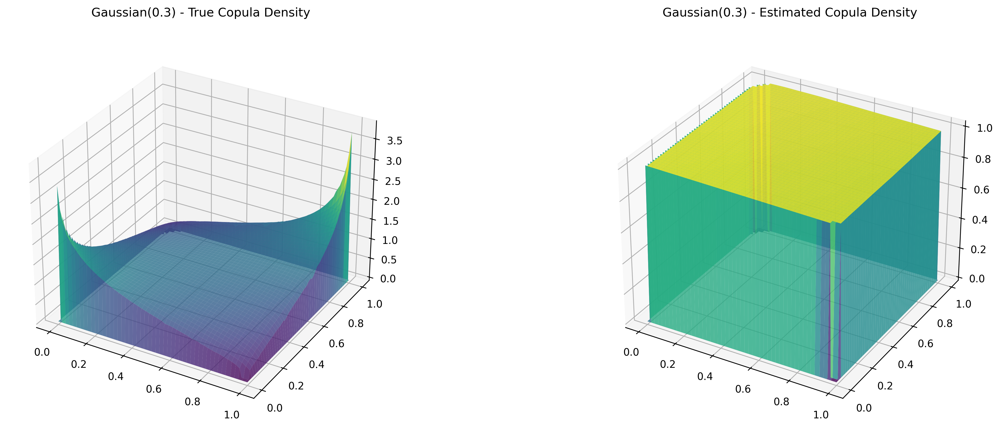

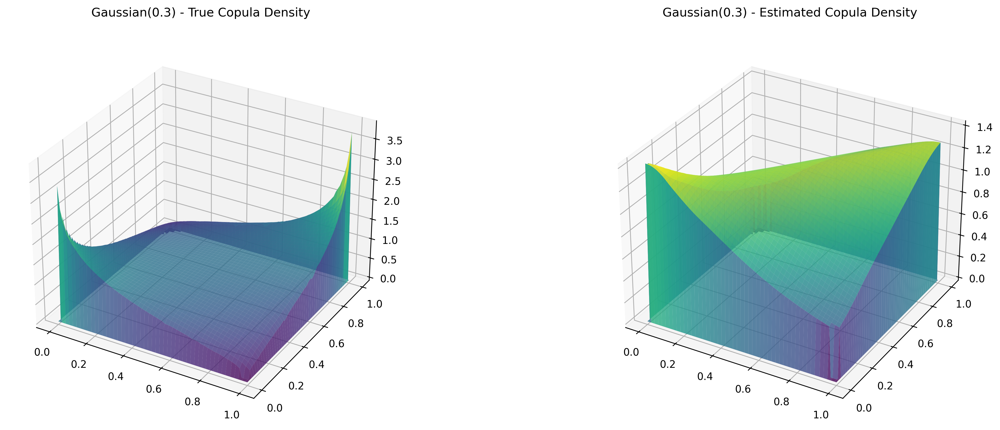

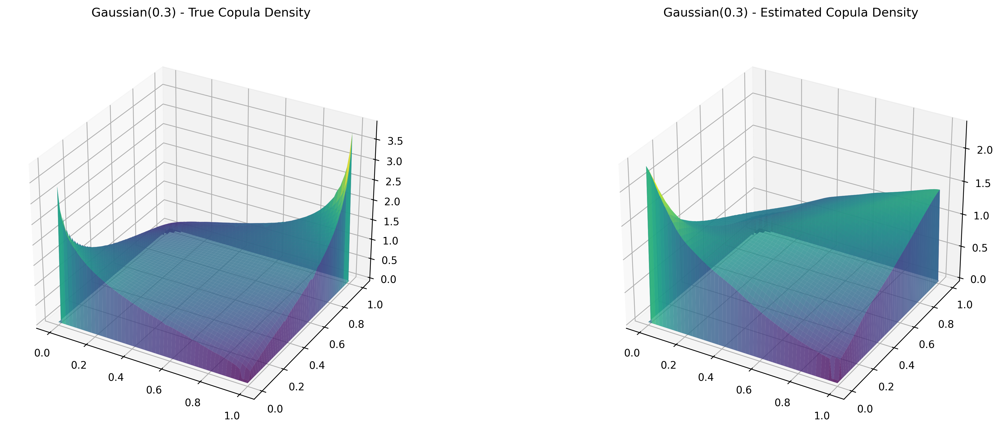

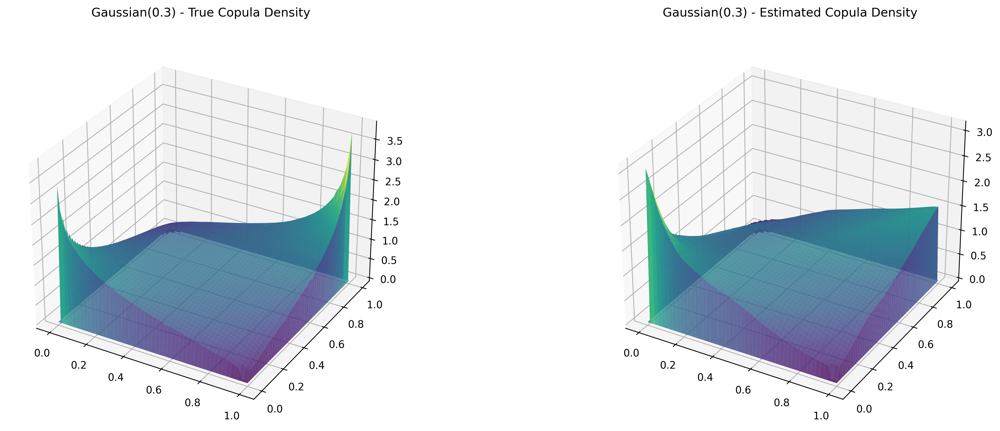

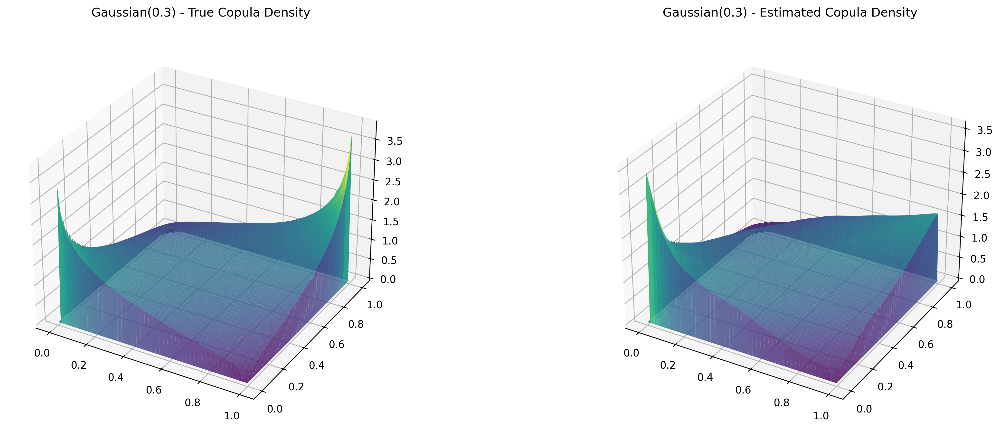

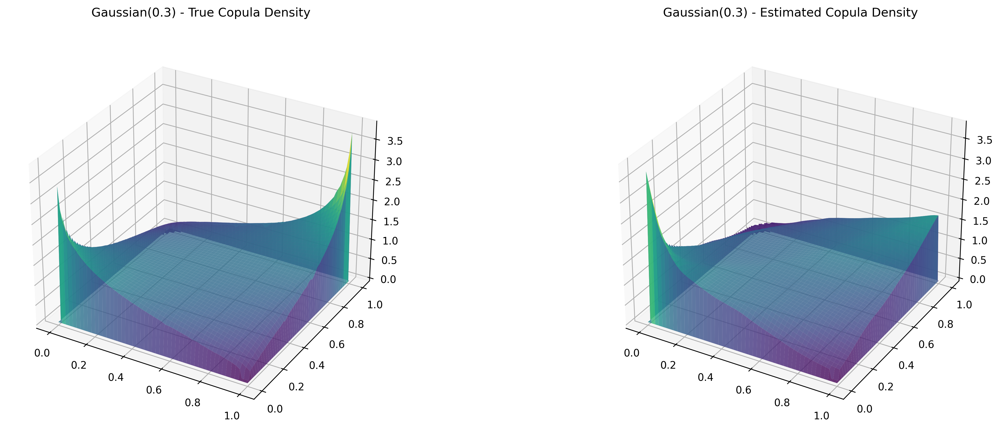

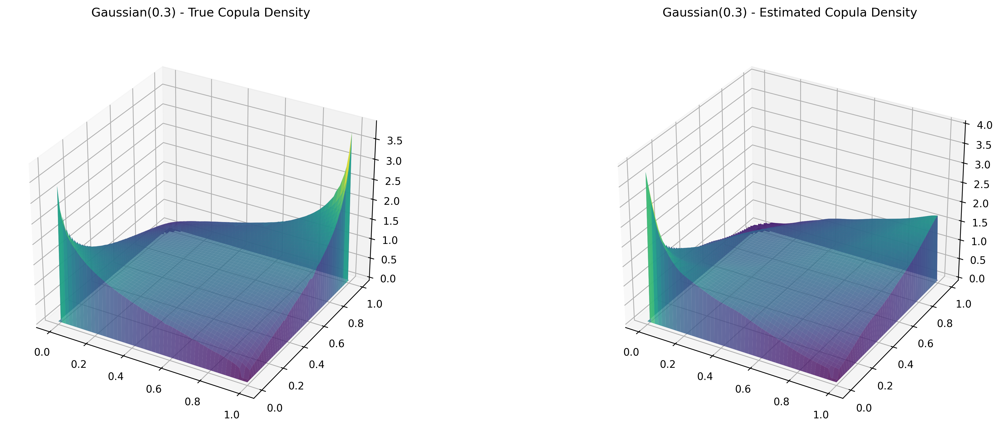

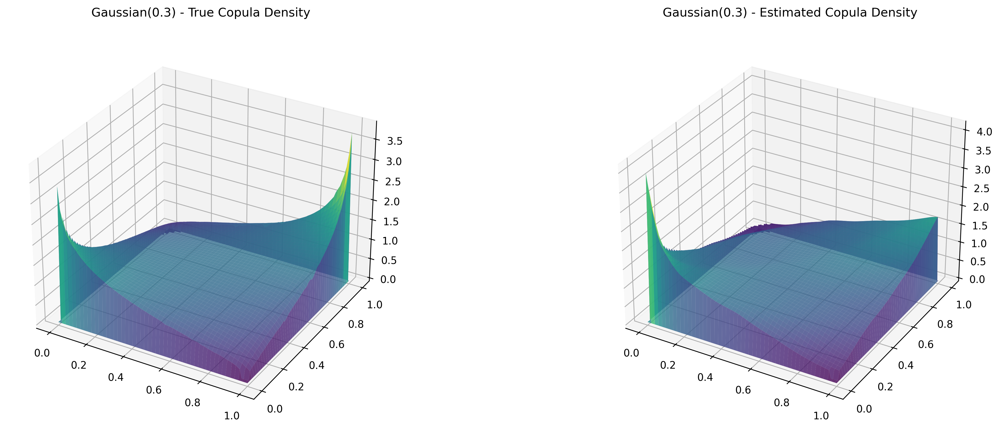

In [13]:
batch_size = 8000
epochs =800
divergence ='HD'
rho = 0.3
dim =2
lr=1e-4
data=GaussianCopula(rho).rvs(batch_size)
Copula_density=GaussianCopula(rho).pdf(data)
cop = Copula(data,Copula_density,lr,dim, divergence, rho)
Copula_density_estimated=cop.train(epochs=epochs, batch_size=batch_size)

## high dimensioanl Mutual information Estimation

In [ ]:
class Copula():
    def __init__(self, data, lr, latent_dim,
                 divergence='KL', rho=0, ema_decay=0.98):
        self.latent_dim = latent_dim
        self.divergence = divergence
        self.rho        = rho
        self.ema_decay  = ema_decay
        self.lr         = lr
        self.data       = data
        optimizer = Adam(learning_rate=self.lr, beta_1=0.5, beta_2=0.999, epsilon=1e-7)
        self.discriminator = self.build_discriminator()
        self.ema_model     = self.build_discriminator()
        self.ema_model.set_weights(self.discriminator.get_weights())
        v        = Input(shape=(self.latent_dim,))
        v_random = Input(shape=(self.latent_dim,))
        d_v        = self.discriminator(v)         
        d_v_random = self.discriminator(v_random)
        self.combined = Model([v, v_random], [d_v, d_v_random])
        # ---------- compile (losses) ----------
        key = self.divergence
        if key in ('KL', 'ReverseKL','JS','PearsonX2'):
            self._compile_fgan(optimizer)
        elif key == 'GAN':  
            self.combined.compile(loss=['binary_crossentropy','binary_crossentropy'],
                                  loss_weights=[1,1], optimizer=optimizer)
        elif key in ('HD'):    
            self.combined.compile(loss=[wasserstein_loss, reciprocal_loss],
                                  loss_weights=[1,1], optimizer=optimizer)
    # # --------- network  ---------
    def build_discriminator(self):
        model = Sequential()
        model.add(Dense(500, input_dim=self.latent_dim)); model.add(LeakyReLU(0.2))
        model.add(Dense(500)); model.add(LeakyReLU(0.2))
        model.add(Dense(500)); model.add(LeakyReLU(0.2))
        model.add(Dense(500)); model.add(LeakyReLU(0.2))
        model.add(Dense(500)); model.add(LeakyReLU(0.2))
        if self.divergence=='GAN':
            model.add(Dense(1, activation='sigmoid'))  
        else:
            model.add(Dense(1, activation=tf.exp))  # s = exp(z) > 0
        T = Input(shape=(self.latent_dim,))
        return Model(T, model(T))
    def _compile_fgan(self, optimizer):
            def to_logit_s(S):  # S is the model output (s = exp(z))
                return tf.math.log(tf.clip_by_value(S, 1e-12, np.inf))
            key = self.divergence
            def loss_Ep_minusT(y, T):    
                return -Kb.mean(T)
            if key == 'KL':
                def loss_p(y, T):
                    z = to_logit_s(T)
                    return -Kb.mean(z)
                def loss_q(y, T):
                    z = to_logit_s(T)
                    return Kb.mean(tf.exp(z - 1.0))
            elif key == 'PearsonX2':
                def loss_p(y, T):
                    z = to_logit_s(T)
                    return -Kb.mean(z)
                def loss_q(y, T):
                    z = to_logit_s(T)
                    return Kb.mean(0.25 * tf.square(z) + z)
            elif key == 'ReverseKL':
                def loss_p(y, T):
                    z = to_logit_s(T)
                    t_neg = -tf.nn.softplus(z)
                    return -Kb.mean(t_neg)
                def loss_q(y, T):
                    z = to_logit_s(T)
                    t_neg = -tf.nn.softplus(z)
                    return Kb.mean(-1.0 - tf.math.log(-t_neg + 1e-6))

            elif key == 'JS':  
                def loss_p(y, T):
                    z = to_logit_s(T)
                    return  tf.reduce_mean(tf.nn.softplus(-z))
                def loss_q(y, T):
                    z = to_logit_s(T)
                    return Kb.mean(tf.nn.softplus( z))
            else:
                raise ValueError

            self.combined.compile(loss=[loss_p, loss_q], loss_weights=[1,1], optimizer=optimizer)
    # --------- map model output s=exp(z) to copula density c(u) ----------
    def _copula_from_output(self, s_joint, s_ind=None):
        """Return copula density estimates"""
        key = self.divergence
        def map_one(s):
            s = np.asarray(s, dtype=np.float64).reshape(-1, 1)
            z = np.log(np.clip(s, EPS, None))  
            if key == 'KL':
                # c(u) = e^{z-1} = s/e
                c = s / np.e
            elif key == 'JS':
                s_clip = np.minimum(s, 2.0 - 1e-6)           
                c = s_clip / np.maximum(2.0 - s_clip, EPS)
            elif key == 'ReverseKL':
                t_neg = -np.log1p(np.clip(s, EPS, None))     
                t_neg = np.minimum(t_neg, -1e-6)
                c = -1.0 / t_neg
            elif key in ('PearsonX2'):
                # c(u) = 1 + z/2
                c = 1.0 + 0.5 * z
                c = np.maximum(c, 1e-9)
            elif key == 'GAN':
                D = np.clip(s, 1e-6, 1-1e-6)     
                c = D / (1.0 - D)
            elif key == 'HD':
                # c(u) = 1 / s^2
                s_pos = np.maximum(s, 1e-12)
                c = 1.0 / np.square(s_pos)
            else:
                raise ValueError(f"Unknown divergence '{key}'")
            return c.reshape(-1, 1)
        c_joint = map_one(s_joint)
        if s_ind is None:
            return c_joint.reshape(-1)
        c_ind = map_one(s_ind)
        return c_joint.reshape(-1), c_ind.reshape(-1)
    # --------- EMA update ---------
    def update_ema_weights(self):
        cw = self.discriminator.get_weights()
        ew = self.ema_model.get_weights()
        self.ema_model.set_weights([self.ema_decay * e + (1 - self.ema_decay) * c for c, e in zip(cw, ew)])
    # --------- training ----------
    def compute_gaussian_mi(cov_matrix):
        return -0.5 * np.log(det(cov_matrix))
    def train(self,cov,d, epochs, batch_size=500):

        valid = np.ones((batch_size, 1), dtype=np.float32)
        fake  = np.zeros((batch_size, 1), dtype=np.float32)
        data_v       = self.data
        estimated_mi=[]
        true_mi_copula = compute_gaussian_mi(cov)
        for epoch in range(epochs):
            epoch_loss = 0.0
            data_v_random=np.random.uniform(0, 1, size=(batch_size, self.latent_dim))
            key = self.divergence
            if key in ('KL', 'JS', 'ReverseKL', 'PearsonX2','HD'):
                d_loss = self.combined.train_on_batch([data_v, data_v_random],
                                                      [valid, valid])
            elif key == 'GAN':
                d_loss = self.combined.train_on_batch([data_v, data_v_random],
                                                      [valid, fake])   # real=1, indep=0
            else:
                raise ValueError(f"Unknown divergence '{key}'")
            epoch_loss += float(d_loss[0])
            # ---- EMA + copula mapping ----
            self.update_ema_weights()
            s_joint = self.ema_model.predict(data_v,        verbose=0)  # s=exp(z)
            s_ind   = self.ema_model.predict(data_v_random, verbose=0)

            c_hat, c_ind = self._copula_from_output(s_joint, s_ind)     
            c_hat = np.asarray(c_hat).flatten() # Copula estimated 
            c_hat=np.where(c_hat > 0, c_hat, 1e-10) # To avoid log(0)
            mi=np.mean(np.log(c_hat), axis=0)
            estimated_mi.append(mi)
            if epoch%200==0:
                plt.figure(figsize=(8, 6))
                plt.axhline(true_mi_copula, color='blue', linestyle='--', label=f'True MI : {true_mi_copula:.4f}')
                plt.plot(range(1, len(estimated_mi)+1), estimated_mi, marker='o', label='Estimated MI (Our)', color='orange')
                plt.xlabel('Epoch')
                plt.ylabel('Mutual Information')
                plt.title('True vs Estimated Mutual Information (5d)')
                plt.legend()
                plt.grid(True)
                plt.show()

        return c_hat, 

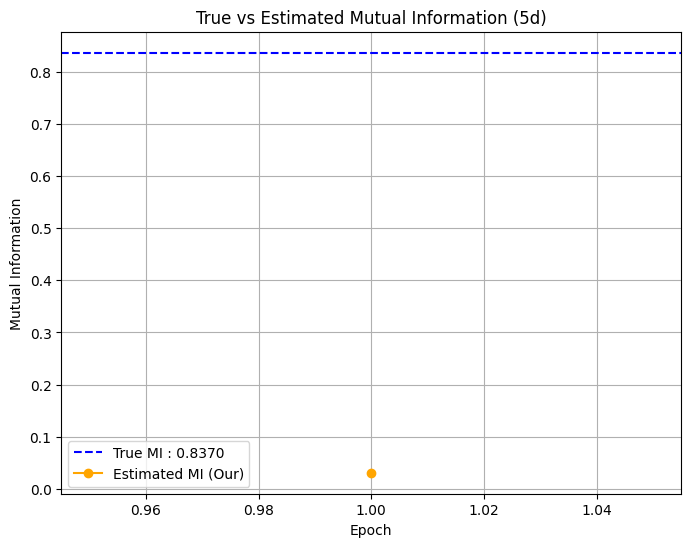

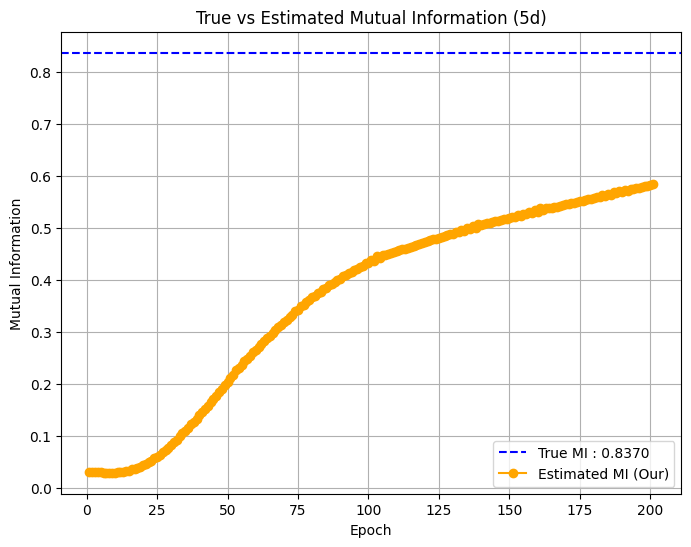

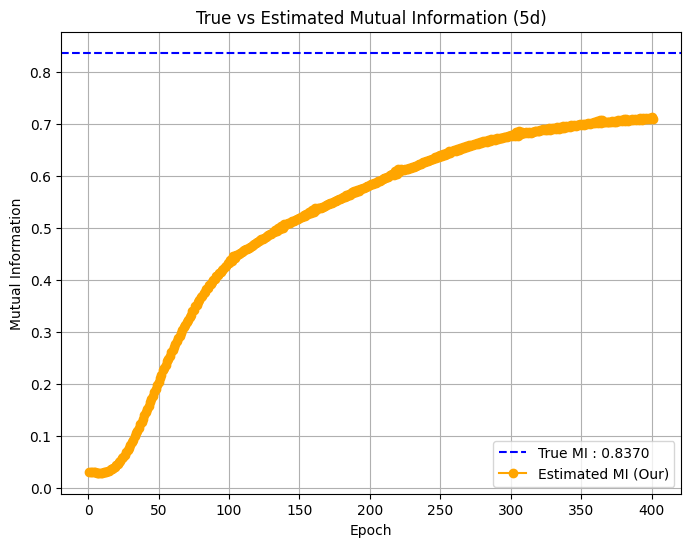

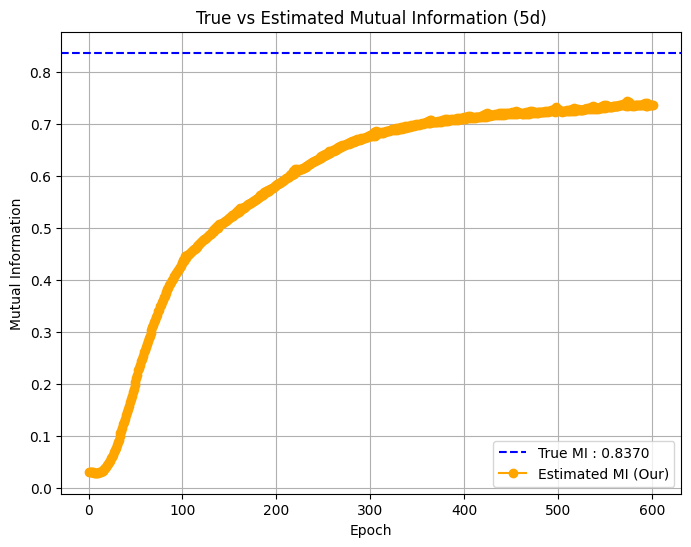

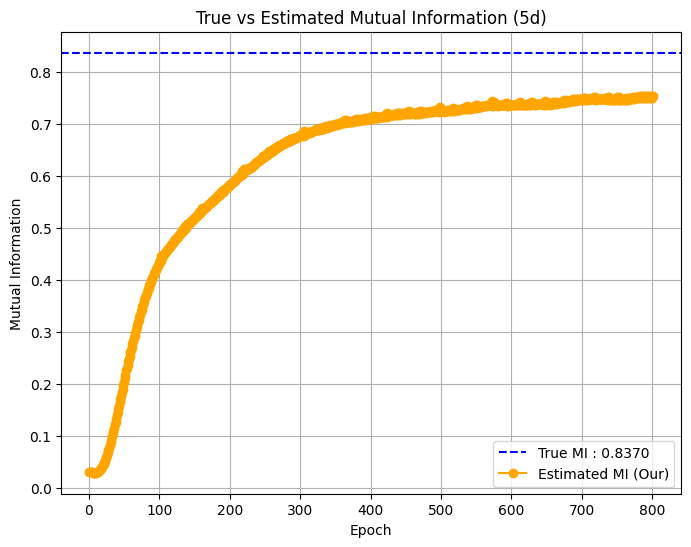

...

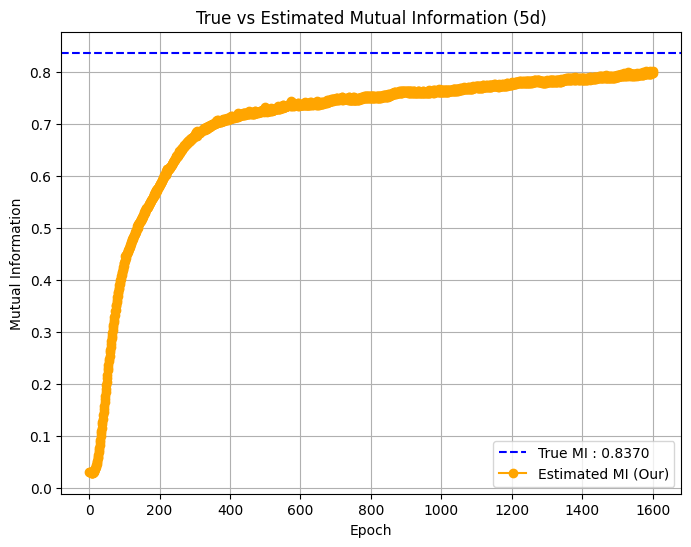

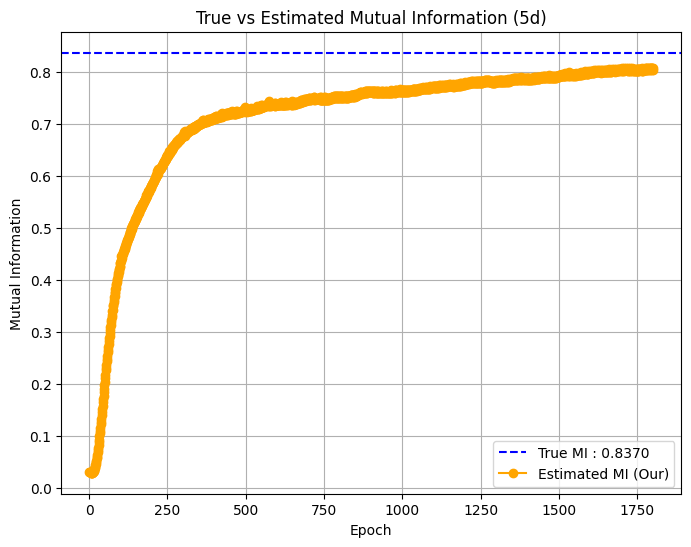

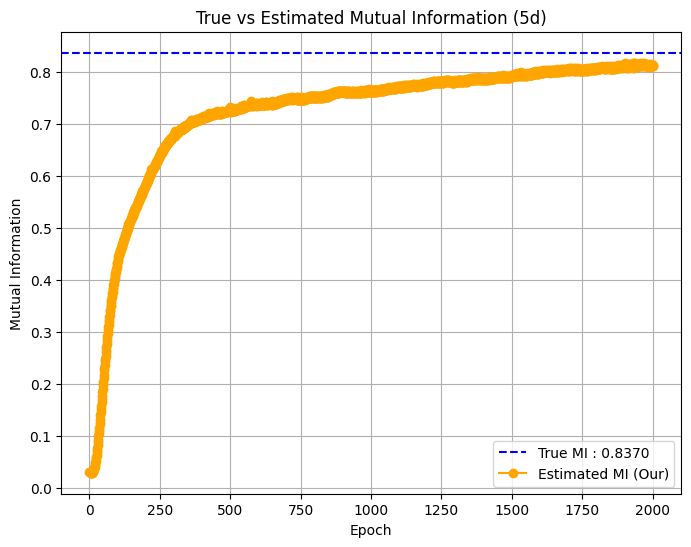

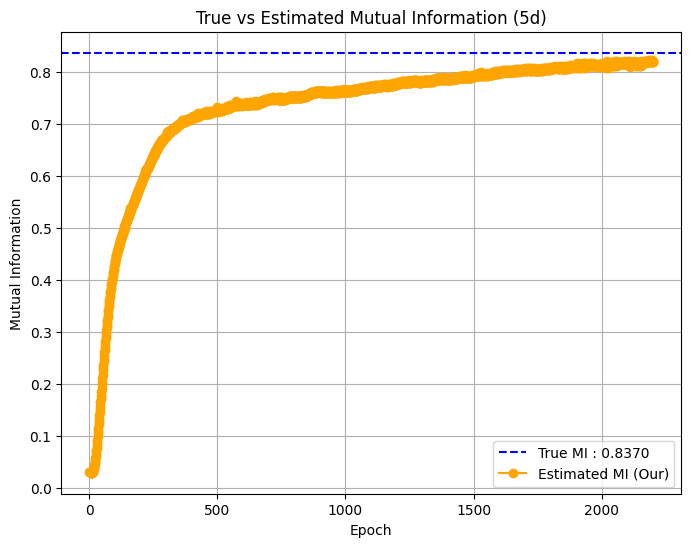

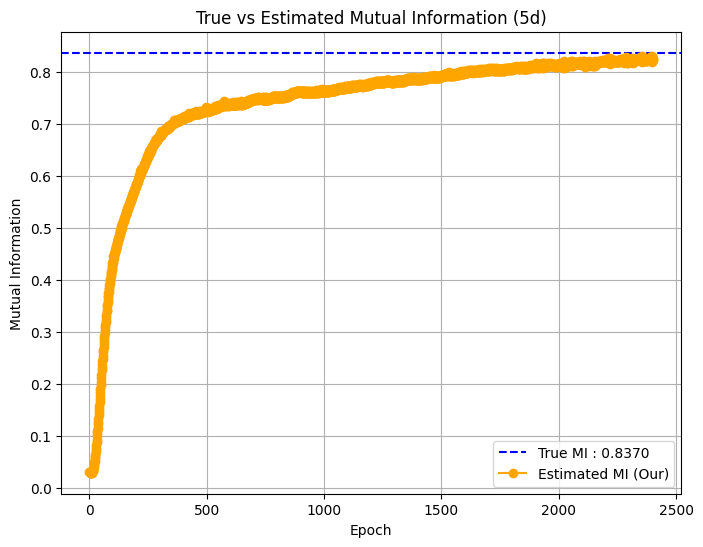

In [28]:
batch_size =10000
epochs =2600
divergence ='HD'
lr=1e-4
n_dim = 5
mean = np.zeros(n_dim)
cov = np.eye(n_dim) * 0.5 + 0.5  
data = generate_gaussian_data(mean, cov, batch_size)
data=norm.cdf(data) 
cop=Copula(data,lr,n_dim, divergence)
Copula_density_estimated=cop.train(cov,n_dim,epochs=epochs, batch_size=batch_size)